In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [13]:
!git clone https://github.com/kavin-du/e16-4yp-Using-Computer-Vision-and-Agent-Based-Modelling-to-Explore-the-Human-Elephant-Conflict.git
!git branch
!git checkout swin_loveda
!git branch
%cd /content/e16-4yp-Using-Computer-Vision-and-Agent-Based-Modelling-to-Explore-the-Human-Elephant-Conflict/code/Swin-v2

/content/e16-4yp-Using-Computer-Vision-and-Agent-Based-Modelling-to-Explore-the-Human-Elephant-Conflict/code/Swin-v2


In [15]:
FILE_NAME = 'iter_32000.pth'
MODEL_CONVERTED = FILE_NAME.split('.')[0]+'_converted.pth'

!curl 'https://mediaflux.researchsoftware.unimelb.edu.au:8443/mflux/share.mfjp?browser=false&_token=5zWSUramAjKuCXXDZpmt1128225375&filename=iter_32000.pth' --output $FILE_NAME

# convert model parameters
!python tools/model_converters/swin2mmseg.py $FILE_NAME $MODEL_CONVERTED

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  686M  100  686M    0     0  5128k      0  0:02:17  0:02:17 --:--:-- 5194k
/usr/local/lib/python3.7/dist-packages/mmcv/__init__.py:21: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  'On January 1, 2023, MMCV will release v2.0.0, in which it will remove '
load checkpoint from local path: iter_32000.pth


In [18]:
!pip install -U openmim
!mim install mmcv-full
!pip install terminaltables

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [10]:
# remove depending on GDrive, upload testing images directly to the repository
# but outputs are saving to drive :|
base = '/content/drive/Shareddrives/FYP-student-group/FYP-related/Code-colab/swin-inference/mmsegmentation/'

config_file = 'configs/swin/upernet_swin_tiny_patch4_window7_512x512_160k_loveda.py'

In [19]:
import sys
import os
from mmseg.apis import init_segmentor, inference_segmentor, show_result_pyplot
from mmseg.core.evaluation import get_palette

configs			  mmseg			  script2_install_packages.sh
demo			  pytest.ini		  script3_prepare_datasets.sh
docker			  README.md		  script4_download_models.sh
docs			  README_original.md	  setup.cfg
iter_32000_converted.pth  requirements		  setup.py
iter_32000.pth		  requirements.txt	  tests
LICENSE			  resources		  tools
mmcv_custom		  script1_create_envs.sh


In [26]:
# build the model from a config file and a checkpoint file
model = init_segmentor(config_file, FILE_NAME, device='cuda')

load checkpoint from local path: iter_32000.pth
The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([150, 512, 1, 1]) from checkpoint, the shape in current model is torch.Size([7, 512, 1, 1]).
size mismatch for decode_head.conv_seg.bias: copying a param with shape torch.Size([150]) from checkpoint, the shape in current model is torch.Size([7]).
size mismatch for auxiliary_head.conv_seg.weight: copying a param with shape torch.Size([150, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([7, 256, 1, 1]).
size mismatch for auxiliary_head.conv_seg.bias: copying a param with shape torch.Size([150]) from checkpoint, the shape in current model is torch.Size([7]).
unexpected key in source state_dict: backbone.layers.0.blocks.0.norm1.weight, backbone.layers.0.blocks.0.norm1.bias, backbone.layers.0.blocks.0.attn.relative_position_bias_table, backbone.layers.0.blocks.0.attn.relative_position

/content/e16-4yp-Using-Computer-Vision-and-Agent-Based-Modelling-to-Explore-the-Human-Elephant-Conflict/code/Swin-v2/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


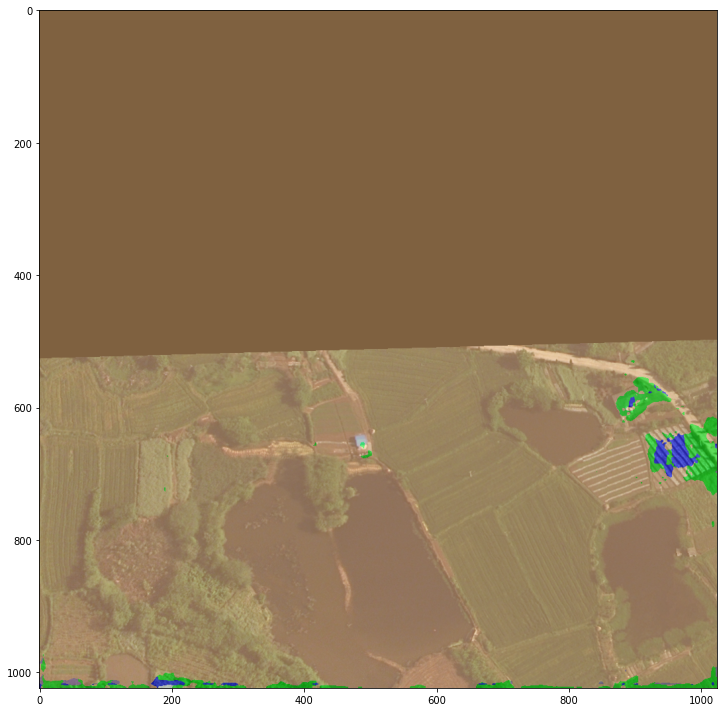

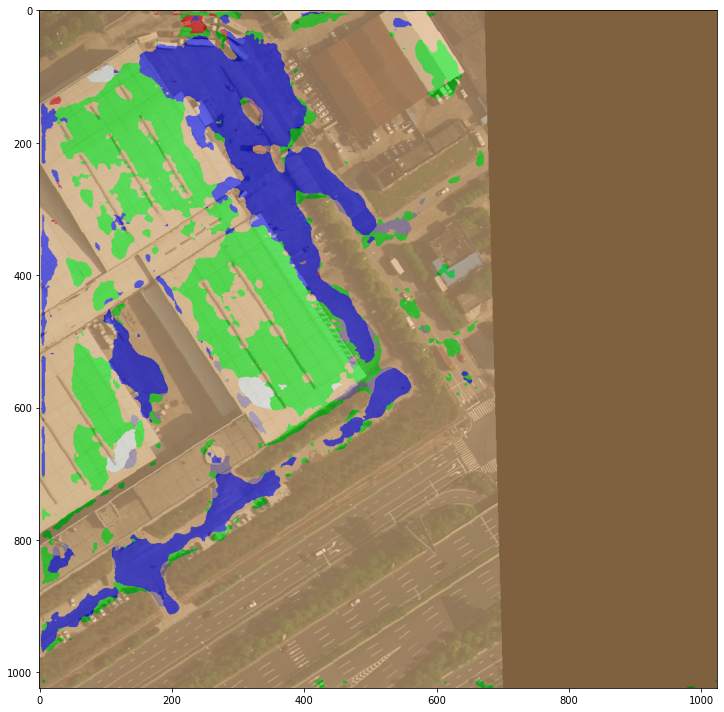

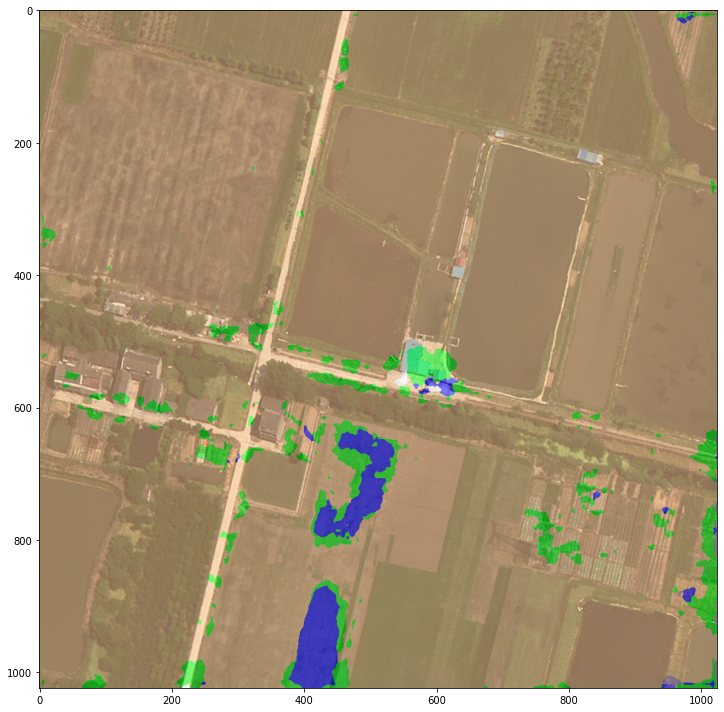

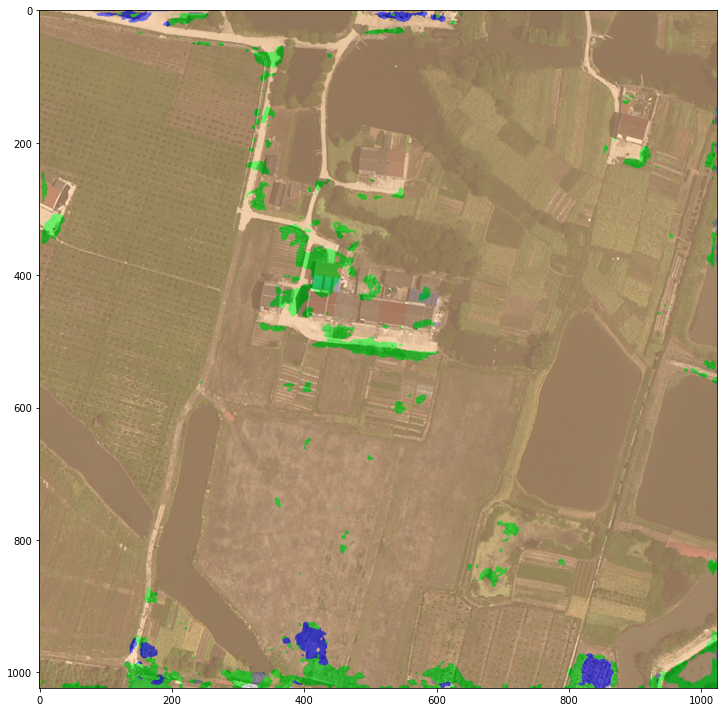

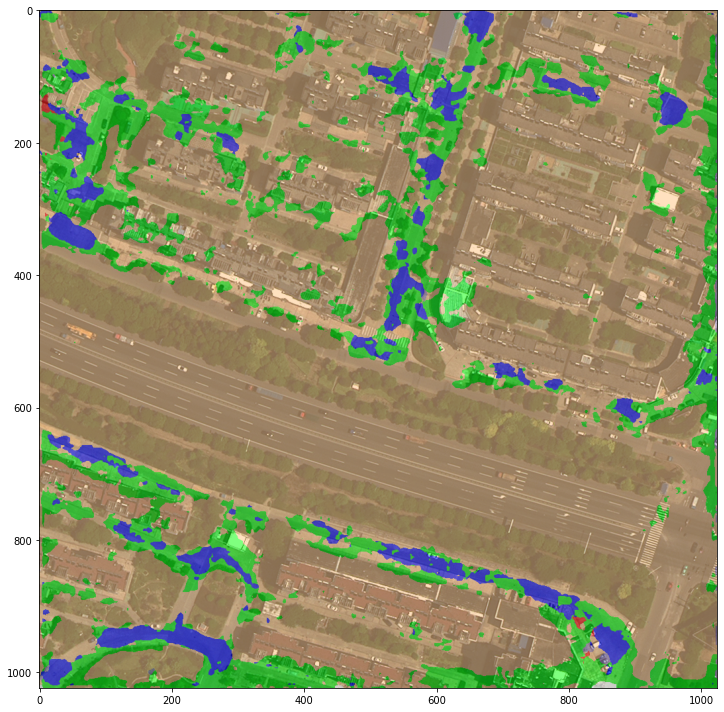

...

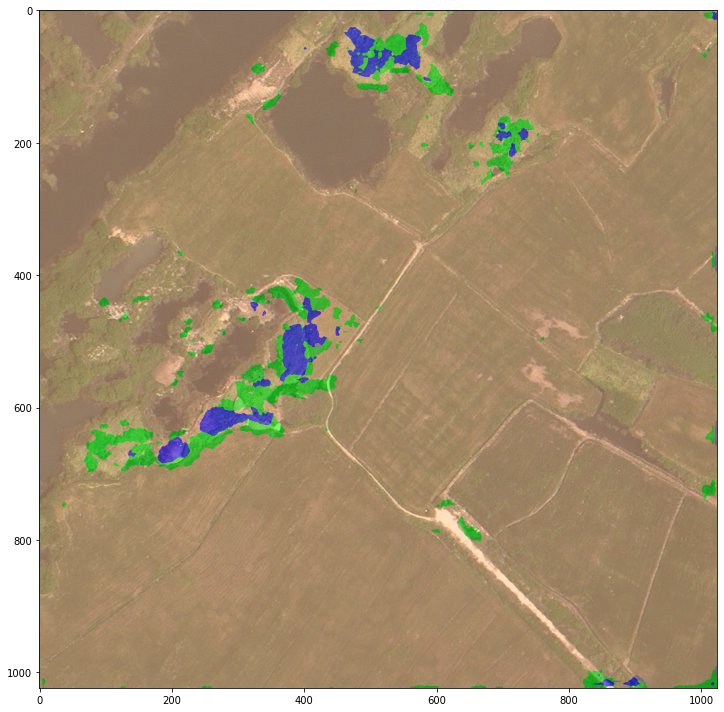

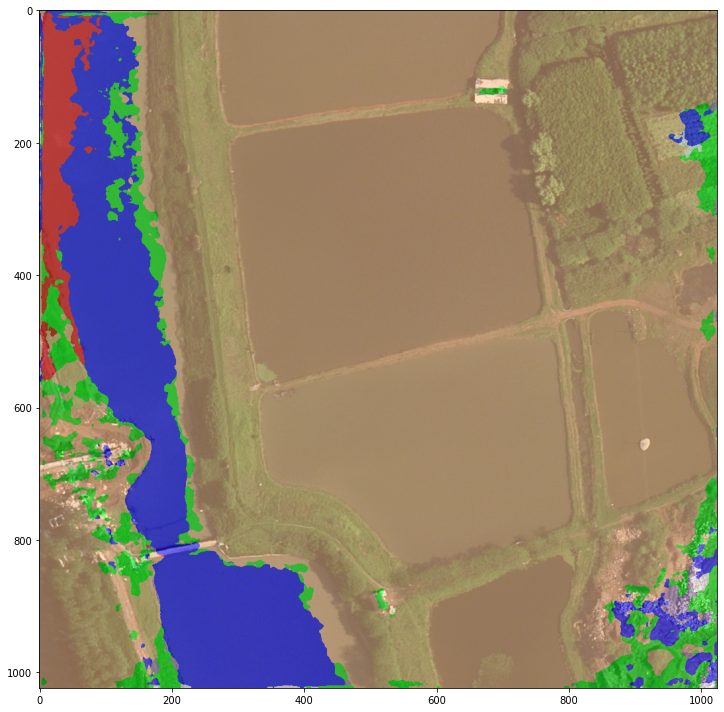

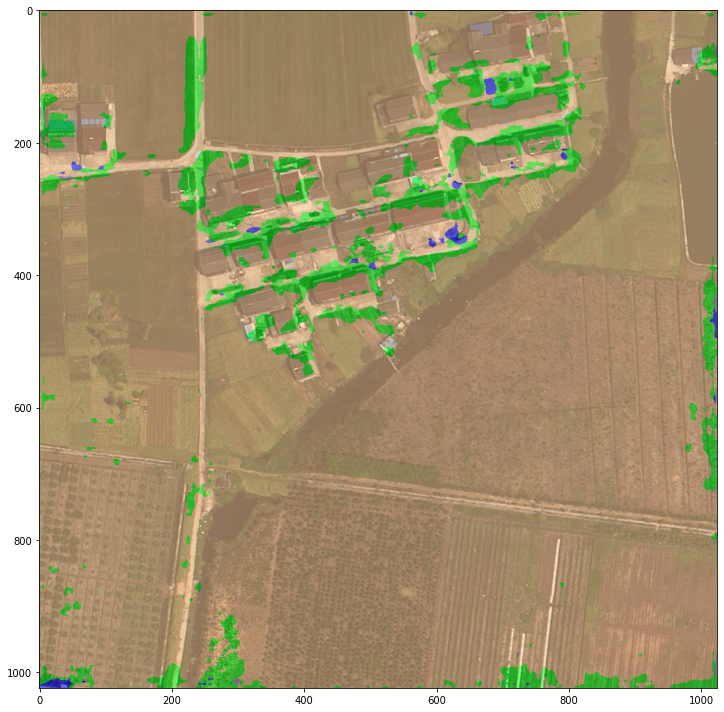

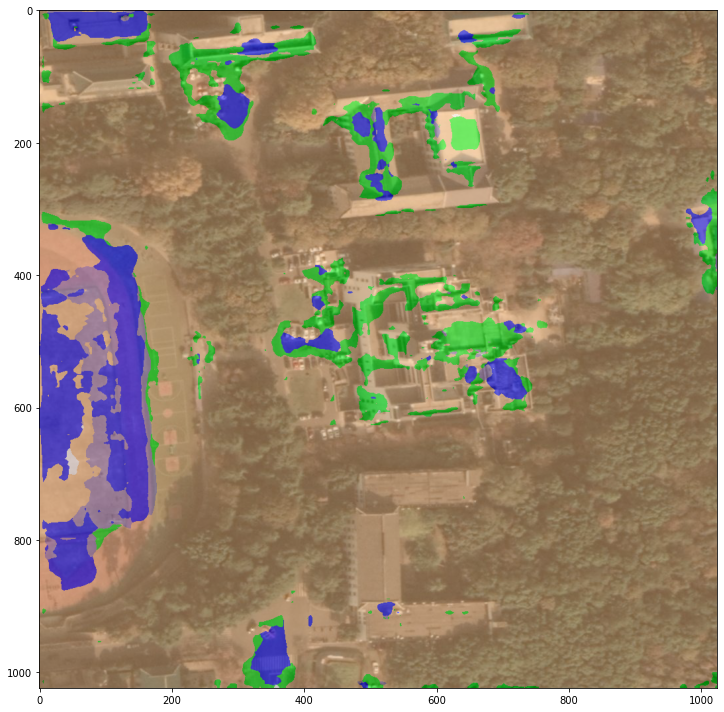

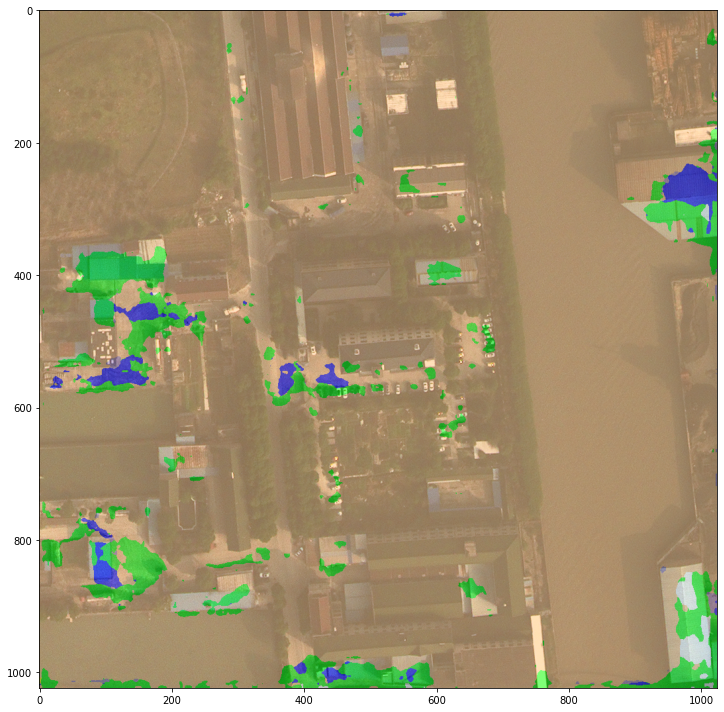

In [27]:
# test images
images = ['4191.png', '4192.png', '4193.png', '4194.png', '4195.png', '4196.png', '4197.png', '4198.png', '4199.png', '4200.png', '5984.png', '5985.png']

for img in images:
  image_path = f'{base}data/{img}'
  output_path = f'{base}results/{img}'
  result = inference_segmentor(model, image_path)
  show_result_pyplot(model, image_path, result, get_palette('loveda'), out_file=output_path)
